In [1]:
!pip install transformers==3.1.0
!gdown --id 1-di0q_8O1_QsOSEm1sIOQWvuSy2LTIYx
!tar -xzvf bert_lex_ktrain_20201221.tar.gz
!pip3 install git+https://github.com/Vakihito/ktrain.git

     |████████████████████████████████| 890kB 7.6MB/s 
     |████████████████████████████████| 3.0MB 49.9MB/s 
     |████████████████████████████████| 901kB 51.1MB/s 
     |████████████████████████████████| 1.2MB 43.8MB/s 
Downloading...
From: https://drive.google.com/uc?id=1-di0q_8O1_QsOSEm1sIOQWvuSy2LTIYx
To: /content/bert_lex_ktrain_20201221.tar.gz
526MB [00:02, 192MB/s]
bert_lex_multilingual_small.model/
bert_lex_multilingual_small.model/tf_model.preproc
bert_lex_multilingual_small.model/tf_model.h5
bert_lex_multilingual_small.model/config.json
df_lex_embeddings.pickle
  Cloning https://github.com/Vakihito/ktrain.git to /tmp/pip-req-build-u6ch0b7g
  Running command git clone -q https://github.com/Vakihito/ktrain.git /tmp/pip-req-build-u6ch0b7g
     |████████████████████████████████| 983kB 8.3MB/s 
     |████████████████████████████████| 266kB 48.8MB/s 
     |████████████████████████████████| 471kB 43.0MB/s 
  Created wheel for ktrain: filename=ktrain-0.25.3-cp37-none-any.whl size=2

In [2]:
img_feat_size = 112
text_feat_size = 768




# BERT.py

In [3]:
import keras
import ktrain
from ktrain import text
import tensorflow as tf
import pickle
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from keras import backend as K

predictor_bert_lex = ktrain.load_predictor('/content/bert_lex_multilingual_small.model')
df_lex  = pickle.load(open('df_lex_embeddings.pickle','rb'))

In [4]:
def get_embedding(text,predictor):
  tokenizer = predictor.preproc.get_tokenizer()
  input_ids = tf.constant(tokenizer.encode(text))[None, :]  # Batch size 1
  outputs = predictor.model.layers[0](input_ids)
  last_hidden_states = outputs[0]  # The last hidden-state is the first element of the output tuple
  v = np.average(last_hidden_states.numpy()[0],axis=0)
  return v

def get_bert_lex(text,k=3,min_query=0.8,use_predictor=False):
  global df_lex, predictor_bert_lex

  sentiment_model = predictor_bert_lex.predict(text)
  features = get_embedding(text,predictor_bert_lex)
  a = np.array([features])
  b = np.array(list(df_lex['embedding']))
  cos_sim = cosine_similarity(a,b)
  df_lex['query'] = cos_sim[0]

  temp = df_lex.sort_values(by='query',ascending=False).head(k)
  if (temp.iloc[0]['query'] > min_query ):
    temp = temp[temp['query'] > min_query]
  sentiment_lex = np.average(np.array(temp['sentiment'].to_list()))
  if use_predictor:
    return temp, sentiment_lex, sentiment_model
  return temp, sentiment_lex

text= 'pessoas brigando na rua'
df_explain, sentiment_lex = get_bert_lex(text,k=7)
print(sentiment_lex)
df_explain.head(1)


-1.0


,text,lang,sentiment,embedding,query
2383,picketing,en,-1,"[0.22929063, 0.15071137, -0.67776394, -0.17623...",0.95456


In [5]:
get_embedding('haha',predictor_bert_lex).shape

(768,)

# Caption.py


In [6]:
# gets the string time as HH:MM:SS and return in seconds
def string_time_int(str_time):
  segundos = int(str_time[-2:])
  segundos += 60 * int(str_time[-5:-3])
  segundos += 3600 * int(str_time[:-6])
  return segundos
def process_caption(video, lang='a.en'):
  '''
    extract the information from the caption and saves in a caption struct 
  '''
  has_caption = False
  print(video.captions)
  for cap in video.captions:
    if cap.code == lang:
      has_caption = True

  if not has_caption:
    print("caption of lang : " + lang + " not found")

  video_len = video.length

  captions  = video.captions[lang]
  captions_str = str(captions.generate_srt_captions())
  list_captions = []
  line_counter = 1
  for line in captions_str.split('\n'):
      # time type
      if (line_counter + 2) % 4  == 0:
          line_aux = line.split(" --> ")
          time_s = string_time_int(line_aux[0][:-4])
          time_e = string_time_int(line_aux[1][:-4])
      # comment type
      if (line_counter + 1) % 4  == 0 and video_len >= time_e:  
          list_captions.append([line, time_s, time_e])
      line_counter += 1

  return list_captions

# face_caption.py


In [7]:
!git clone https://github.com/oarriaga/face_classification.git

Cloning into 'face_classification'...
remote: Enumerating objects: 990, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 990 (delta 1), reused 0 (delta 0), pack-reused 984
Receiving objects: 100% (990/990), 121.30 MiB | 34.96 MiB/s, done.
Resolving deltas: 100% (554/554), done.


In [8]:
!pip install pytube

     |████████████████████████████████| 51kB 4.0MB/s 


In [9]:
def my_preprocess_input(x, v2=True):
    x = x.astype('float32')
    x = x / 255.0
    if v2:
        x = x - 0.5
        x = x * 2.0
    return x

In [10]:
import cv2
from pytube import YouTube
from pytube.helpers import safe_filename
from statistics import mode
import os
from keras import backend as K


import cv2
from keras.models import load_model
import numpy as np
from textblob import TextBlob


from face_classification.src.utils.datasets import get_labels
from face_classification.src.utils.inference import detect_faces
from face_classification.src.utils.inference import draw_text
from face_classification.src.utils.inference import draw_bounding_box
from face_classification.src.utils.inference import apply_offsets
from face_classification.src.utils.inference import load_detection_model

from google.colab.patches import cv2_imshow


In [11]:
def my_preprocess_input(x, v2=True):
    x = x.astype('float32')
    x = x / 255.0
    if v2:
        x = x - 0.5
        x = x * 2.0
    return x

def predict_text(text):
    global predictor_bert_lex
    polarity_text = predictor_bert_lex.predict(text)

    color = np.asarray((255, 255, 255))

    if polarity_text < -0.4:
        color = abs(polarity_text) * np.asarray((255, 0, 0))
    elif polarity_text > 0.4:
        color = abs(polarity_text) * np.asarray((0, 255, 0))
    
    return color, polarity_text



# parameters for loading data and images
detection_model_path = './face_classification/trained_models/detection_models/haarcascade_frontalface_default.xml'
emotion_model_path = './face_classification/trained_models/emotion_models/fer2013_mini_XCEPTION.51-0.63.hdf5'
emotion_labels = get_labels('fer2013')
emotion_labels

{0: 'angry',
 1: 'disgust',
 2: 'fear',
 3: 'happy',
 4: 'sad',
 5: 'surprise',
 6: 'neutral'}

In [12]:

# hyper-parameters for bounding boxes shape
frame_window = 10
emotion_offsets = (20, 40)

# loading models
face_detection = load_detection_model(detection_model_path)
emotion_classifier = load_model(emotion_model_path, compile=False)



def getFaceEmbedding(gray_face,layer_out=3):
  global emotion_classifier
  inp = emotion_classifier.input

  functor1 = K.function([inp], emotion_classifier.layers[-layer_out].output)
  emotion_prediction = functor1([gray_face])[0]

  return emotion_prediction.flatten()

In [13]:

# getting input model shapes for inference
emotion_target_size = emotion_classifier.input_shape[1:3]

# starting lists for calculating modes
emotion_window = []

# starting video streaming


vid_id = "xiQ38WKoF2E"
url = "https://www.youtube.com/watch?v=" + vid_id
res = 480


print("downloading the video from the ulr : ", url)
video = YouTube(url)

max_res = -1
itag_max = -1

fps_my = 30
for stream in video.streams:
    if stream.resolution and stream.mime_type == "video/mp4":
      current_res = int(stream.resolution[:-1])
      current_fps = int(stream.fps)
      if current_res <= res and max_res < current_res:
        max_res = current_res
        itag_max = stream.itag
        fps_my =  float(current_fps) 

if max_res == -1:
  print("erro : chose another resolution")

font_scale_cur = max_res/144

print(str(itag_max))
video.streams.get_by_itag(str(itag_max)).download()

dirname = './'
video_path = os.path.join(dirname, safe_filename(video.title) + '.mp4')


#documentation: https://pypi.org/project/pafy/
# video_capture = cv2.VideoCapture(video_path)


captions_list = process_caption(video,'en')
captions_list.sort(key=lambda x: x[1])


time = 0
frame_counter = 0
caption_counter = 0

video_frequency = 10

downloading the video from the ulr :  https://www.youtube.com/watch?v=xiQ38WKoF2E
135
{'en': <Caption lang="English" code="en">, 'a.en': <Caption lang="English (auto-generated)" code="a.en">}


In [14]:
for i in range(len(captions_list)):
  captions_list[i][0] = captions_list[i][0].replace(u'\xa0', u' ')

In [15]:
video_dict_all = {
    'frame' : [],
    'time' : [],
    'caption' : [],
    'caption_polarity' : [],
    'caption_emb' : [],
    'face' : [],
    'face_polarity' : [],
    'face_emb' : []

}

In [16]:
def fill_dict(frame,time,
              caption, caption_polarity, caption_emb,
              face, face_polarity, face_emb):
  video_df_all = {
    'frame' : [frame],
    'time' : [time],
    'caption' : caption,
    'caption_polarity' : caption_polarity,
    'caption_emb' : caption_emb,
    'face' : face,
    'face_polarity' : face_polarity,
    'face_emb' : face_emb
  }

  if len(caption) == 0:
    video_df_all['caption'] = ['-1']
    video_df_all['caption_polarity'] = [0]
    video_df_all['caption_emb'] = [np.zeros(text_feat_size)]

  if len(face) == 0:
    video_df_all['face'] = ['-1']
    video_df_all['face_polarity'] = [0]
    video_df_all['face_emb'] = [np.zeros(img_feat_size)]
  
  if len(face) >= 2:
    for i in range(len(face) - 1):
      video_df_all['frame'].append(video_df_all['frame'][-1])
      video_df_all['time'].append(video_df_all['time'][-1])
      video_df_all['caption'].append(video_df_all['caption'][-1])
      video_df_all['caption_polarity'].append(video_df_all['caption_polarity'][-1])
      video_df_all['caption_emb'].append(video_df_all['caption_emb'][-1])

  return video_df_all

In [17]:
captions_list_size = len(captions_list)

def return_text(time, counter):
  temp_text = ""
  for i in range(counter, captions_list_size):
    if time >= captions_list[i][1] and time <= captions_list[caption_counter][2]:
      temp_text +=  captions_list[i][0] + " "
    elif captions_list[i][1] > time:
      return  temp_text
  return temp_text

In [18]:
def ResizeWithAspectRatio(image, width=None, height=None, inter=cv2.INTER_AREA):
    dim = None
    (h, w) = image.shape[:2]

    if width is None and height is None:
        return image
    if width is None:
        r = height / float(h)
        dim = (int(w * r), height)
    else:
        r = width / float(w)
        dim = (width, int(h * r))

    return cv2.resize(image, dim, interpolation=inter)

In [19]:
# from cv2 import imread
# rgb_image = imread('/content/download (3).png')
# cur_text ='im happy today'
# color_caption = (0,255,0)
size_shape = ( 240 , 320 )



caption polarity: [0.72048765]
caption sentence: Today we are going to 
face polarity:  0.0 neutral
fc :  1
fc :  2
fc :  3
fc :  4
fc :  5
fc :  6
fc :  7
fc :  8
fc :  9
fc :  10
fc :  10


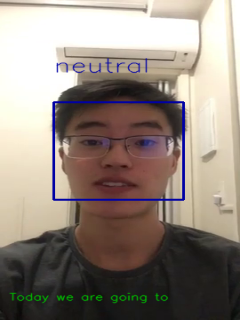

##################################################
caption polarity: [0.72048765]
caption sentence: Today we are going to 
face polarity:  0.0 neutral
fc :  11
fc :  12
fc :  13
fc :  14
fc :  15
fc :  16
fc :  17
fc :  18
fc :  19
fc :  20
fc :  20


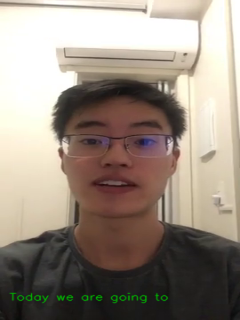

##################################################
caption polarity: [0.72048765]
caption sentence: Today we are going to 
you shall not pass
fc :  21
fc :  22
fc :  23
fc :  24
fc :  25
fc :  26
fc :  27
fc :  28
fc :  29
fc :  30
fc :  30


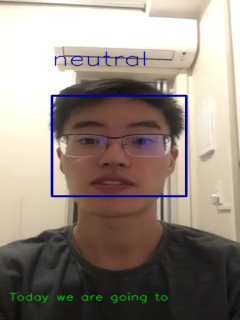

##################################################
caption polarity: [0.60818994]
caption sentence: Today we are going to  show you guys 
face polarity:  0.0 neutral
fc :  31
fc :  32
fc :  33
fc :  34
face not found !
fc :  35
fc :  36
fc :  37
fc :  38
fc :  39
fc :  40
fc :  40


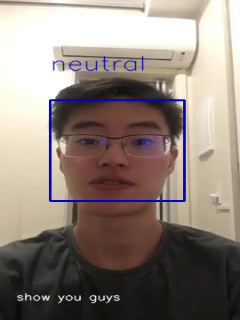

##################################################
caption polarity: [0.25682628]
caption sentence:  show you guys 
face polarity:  0.0 neutral
fc :  41
fc :  42
fc :  43
fc :  44
fc :  45
fc :  46
fc :  47
fc :  48
fc :  49
fc :  50
fc :  50


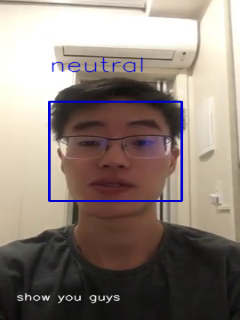

##################################################
caption polarity: [0.25682628]
caption sentence:  show you guys 
face polarity:  0.0 neutral
fc :  51
fc :  52
fc :  53
fc :  54
fc :  55
fc :  56
fc :  57
fc :  58
fc :  59
fc :  60
fc :  60


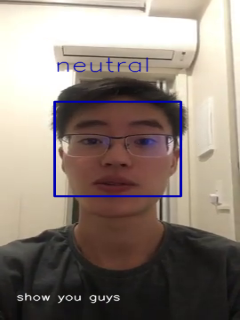

##################################################
caption polarity: [0.2505036]
caption sentence:  show you guys uh  
face polarity:  0.0 neutral
fc :  61
fc :  62
fc :  63
face not found !
fc :  64
face not found !
fc :  65
fc :  66
fc :  67
fc :  68
fc :  69
fc :  70
fc :  70


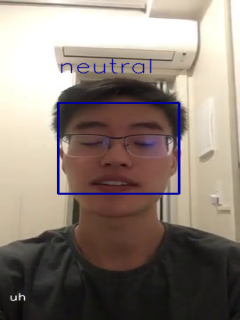

##################################################
caption polarity: [0.16538844]
caption sentence: uh  
face not found !
fc :  71
fc :  72
fc :  73
fc :  74
fc :  75
fc :  76
fc :  77
fc :  78
fc :  79
fc :  80
fc :  80


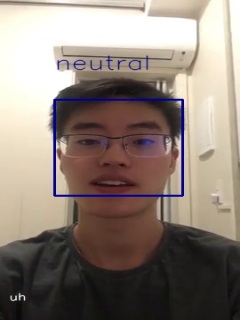

##################################################
caption polarity: [0.16538844]
caption sentence: uh  
you shall not pass
fc :  81
fc :  82
fc :  83
fc :  84
fc :  85
fc :  86
fc :  87
fc :  88
fc :  89
fc :  90
fc :  90


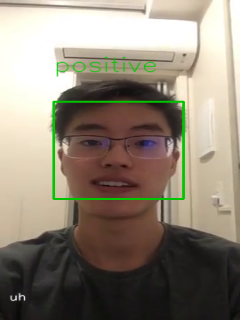

##################################################
caption polarity: [0.16538844]
caption sentence: uh  
face polarity:  0.7492200136184692 happy
fc :  91
fc :  92
fc :  93
fc :  94
fc :  95
fc :  96
fc :  97
fc :  98
fc :  99
fc :  100
fc :  100


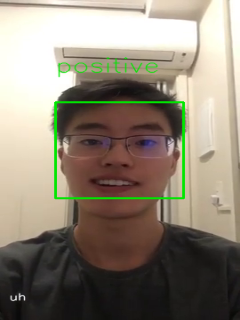

##################################################
caption polarity: [0.16538844]
caption sentence: uh  
face polarity:  0.8937367796897888 happy
fc :  101
fc :  102
fc :  103
fc :  104
fc :  105
fc :  106
fc :  107
fc :  108
fc :  109
fc :  110
fc :  110


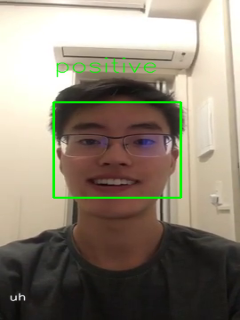

##################################################
caption polarity: [0.16538844]
caption sentence: uh  
face polarity:  0.950355589389801 happy
fc :  111
fc :  112
fc :  113
fc :  114
fc :  115
fc :  116
fc :  117
fc :  118
fc :  119
fc :  120
fc :  120


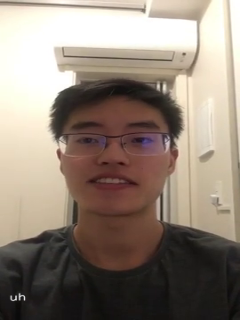

##################################################
caption polarity: [0.39222538]
caption sentence: uh  a demonstration of my project 
face polarity:  0.0 neutral
fc :  121
fc :  122
fc :  123
fc :  124
fc :  125
fc :  126
fc :  127
fc :  128
fc :  129
fc :  130
fc :  130


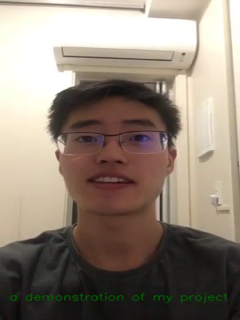

##################################################
caption polarity: [0.4008933]
caption sentence: a demonstration of my project 
you shall not pass
fc :  131
fc :  132
fc :  133
fc :  134
fc :  135
fc :  136
fc :  137
fc :  138
fc :  139
fc :  140
fc :  140


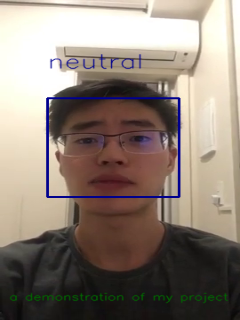

##################################################
caption polarity: [0.4008933]
caption sentence: a demonstration of my project 
face polarity:  0.0 neutral
fc :  141
fc :  142
fc :  143
fc :  144
fc :  145
fc :  146
fc :  147
fc :  148
fc :  149
fc :  150
fc :  150


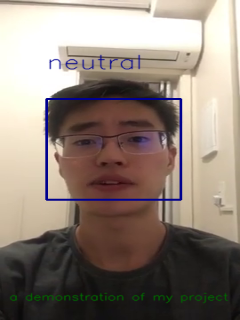

##################################################
caption polarity: [0.48458612]
caption sentence: a demonstration of my project uh an application that shows how  
face polarity:  0.0 neutral
fc :  151
fc :  152
fc :  153
fc :  154
fc :  155
fc :  156
fc :  157
fc :  158
fc :  159
face not found !
fc :  160
fc :  160


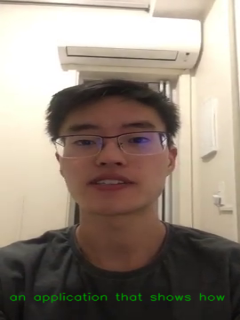

##################################################
caption polarity: [0.6134864]
caption sentence: an application that shows how  
face polarity:  0.0 neutral
fc :  161
fc :  162
fc :  163
fc :  164
fc :  165
fc :  166
fc :  167
fc :  168
fc :  169
fc :  170
fc :  170


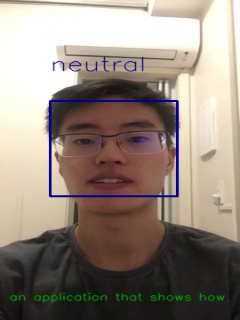

##################################################
caption polarity: [0.6134864]
caption sentence: an application that shows how  
face polarity:  0.0 neutral
fc :  171
fc :  172
fc :  173
fc :  174
fc :  175
face not found !
fc :  176
fc :  177
fc :  178
fc :  179
fc :  180
fc :  180


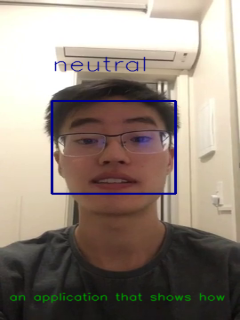

##################################################
caption polarity: [0.6134864]
caption sentence: an application that shows how  
face polarity:  0.0 neutral
fc :  181
fc :  182
fc :  183
fc :  184
fc :  185
fc :  186
fc :  187
fc :  188
fc :  189
fc :  190
fc :  190


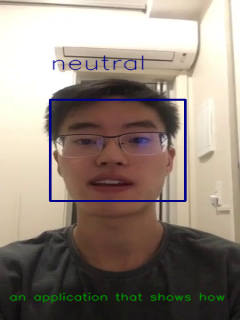

##################################################
caption polarity: [0.6134864]
caption sentence: an application that shows how  
you shall not pass
fc :  191
fc :  192
fc :  193
fc :  194
fc :  195
fc :  196
fc :  197
fc :  198
fc :  199
fc :  200
fc :  200


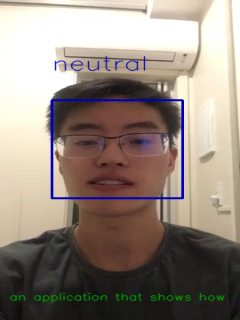

##################################################
caption polarity: [0.6134864]
caption sentence: an application that shows how  
face polarity:  0.0 neutral
fc :  201
face not found !
fc :  202
fc :  203
fc :  204
fc :  205
fc :  206
fc :  207
fc :  208
fc :  209
fc :  210
fc :  210


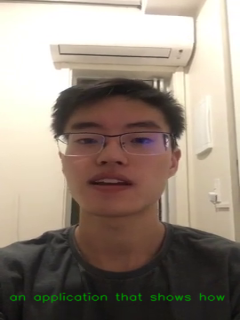

##################################################
caption polarity: [0.6134864]
caption sentence: an application that shows how  
you shall not pass
fc :  211
fc :  212
fc :  213
fc :  214
fc :  215
fc :  216
fc :  217
fc :  218
fc :  219
fc :  220
fc :  220


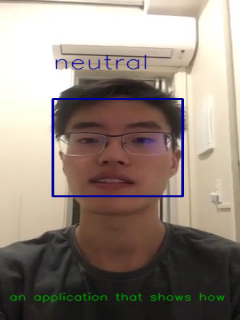

##################################################
caption polarity: [0.6134864]
caption sentence: an application that shows how  
you shall not pass
fc :  221
fc :  222
fc :  223
fc :  224
fc :  225
fc :  226
fc :  227
fc :  228
fc :  229
fc :  230
fc :  230


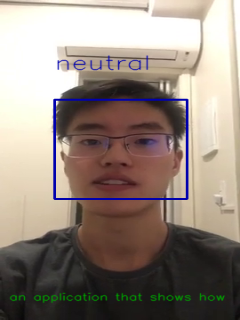

##################################################
caption polarity: [0.6134864]
caption sentence: an application that shows how  
face polarity:  0.0 neutral
fc :  231
fc :  232
fc :  233
fc :  234
fc :  235
fc :  236
fc :  237
fc :  238
fc :  239
fc :  240
fc :  240


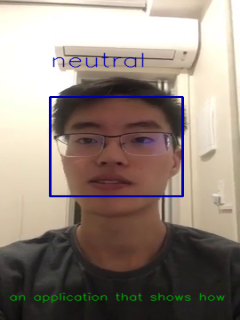

##################################################
caption polarity: [0.67842126]
caption sentence: an application that shows how  how the model performs  
face polarity:  0.0 neutral
fc :  241
fc :  242
fc :  243
fc :  244
fc :  245
fc :  246
fc :  247
fc :  248
fc :  249
fc :  250
fc :  250


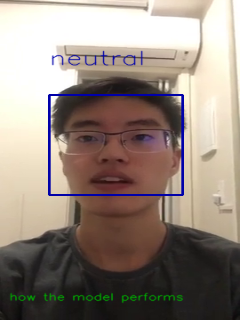

##################################################
caption polarity: [0.65362924]
caption sentence: how the model performs  
face polarity:  0.0 neutral
fc :  251
fc :  252
fc :  253
fc :  254
fc :  255
fc :  256
fc :  257
fc :  258
fc :  259
fc :  260
fc :  260


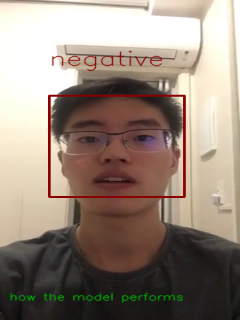

##################################################
caption polarity: [0.65362924]
caption sentence: how the model performs  
you shall not pass
fc :  261
fc :  262
fc :  263
fc :  264
fc :  265
fc :  266
fc :  267
fc :  268
fc :  269
fc :  270
fc :  270


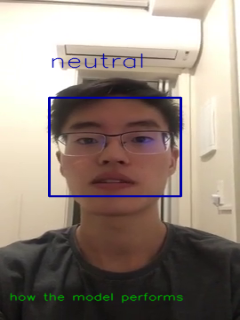

##################################################
caption polarity: [0.8009223]
caption sentence: how the model performs  and how we're training  
face polarity:  0.0 neutral
fc :  271
fc :  272
fc :  273
fc :  274
fc :  275
fc :  276
fc :  277
fc :  278
fc :  279
fc :  280
fc :  280


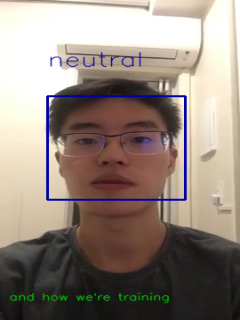

##################################################
caption polarity: [0.7261568]
caption sentence: and how we're training  
you shall not pass
fc :  281
fc :  282
fc :  283
fc :  284
fc :  285
fc :  286
fc :  287
fc :  288
fc :  289
fc :  290
fc :  290


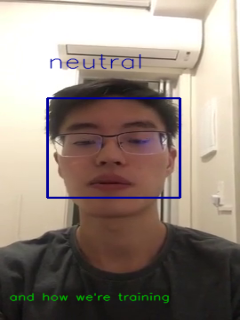

##################################################
caption polarity: [0.7261568]
caption sentence: and how we're training  
face polarity:  0.0 neutral
fc :  291
fc :  292
fc :  293
fc :  294
fc :  295
fc :  296
fc :  297
fc :  298
fc :  299
fc :  300
fc :  300


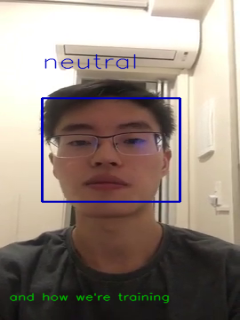

##################################################
caption polarity: [0.7261568]
caption sentence: and how we're training  
face polarity:  0.0 neutral
fc :  301
fc :  302
fc :  303
fc :  304
fc :  305
fc :  306
fc :  307
fc :  308
fc :  309
fc :  310
fc :  310


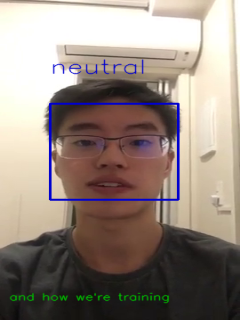

##################################################
caption polarity: [0.7261568]
caption sentence: and how we're training  
face polarity:  0.0 neutral
fc :  311
fc :  312
fc :  313
fc :  314
fc :  315
fc :  316
fc :  317
fc :  318
fc :  319
fc :  320
fc :  320


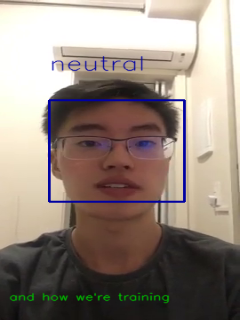

##################################################
caption polarity: [0.7261568]
caption sentence: and how we're training  
face polarity:  0.0 neutral
fc :  321
fc :  322
fc :  323
fc :  324
fc :  325
fc :  326
fc :  327
fc :  328
fc :  329
fc :  330
fc :  330


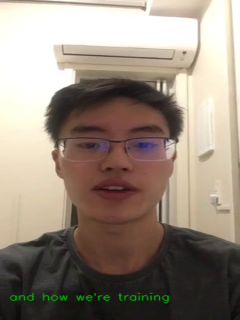

##################################################
caption polarity: [0.656863]
caption sentence: and how we're training  uh 
face polarity:  0.0 neutral
fc :  331
fc :  332
fc :  333
fc :  334
fc :  335
fc :  336
fc :  337
fc :  338
fc :  339
fc :  340
fc :  340


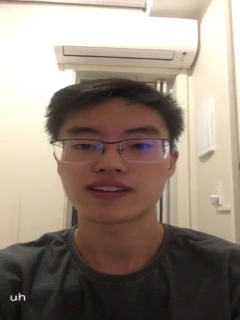

##################################################
caption polarity: [0.16538844]
caption sentence: uh 
fc :  341
fc :  342
fc :  343
fc :  344
fc :  345
fc :  346
fc :  347
fc :  348
fc :  349
fc :  350
fc :  350


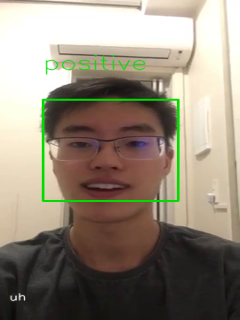

##################################################
caption polarity: [0.16538844]
caption sentence: uh 
face polarity:  0.9529769420623779 happy
fc :  351
fc :  352
fc :  353
fc :  354
fc :  355
fc :  356
fc :  357
fc :  358
fc :  359
fc :  360
fc :  360


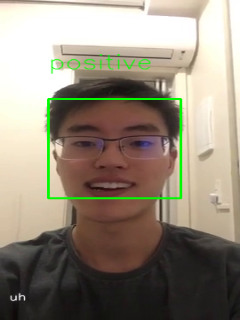

##################################################
caption polarity: [0.69183874]
caption sentence: uh  it's obvious that 
face polarity:  0.9899210929870605 happy
fc :  361
fc :  362
fc :  363
fc :  364
fc :  365
fc :  366
fc :  367
fc :  368
fc :  369
fc :  370
fc :  370


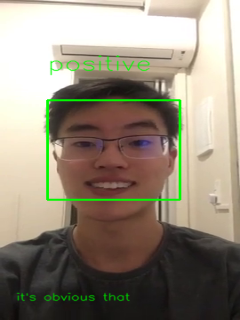

##################################################
caption polarity: [0.7542616]
caption sentence:  it's obvious that 
face polarity:  0.9562485218048096 happy
fc :  371
fc :  372
fc :  373
fc :  374
fc :  375
fc :  376
fc :  377
fc :  378
fc :  379
fc :  380
fc :  380


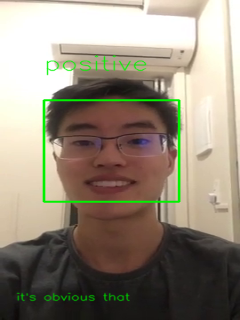

##################################################
caption polarity: [0.7542616]
caption sentence:  it's obvious that 
face polarity:  0.9655694961547852 happy
fc :  381
fc :  382
fc :  383
fc :  384
fc :  385
fc :  386
fc :  387
fc :  388
fc :  389
fc :  390
fc :  390


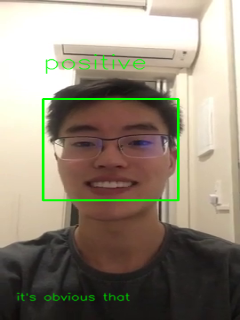

##################################################
caption polarity: [-0.24472171]
caption sentence:  it's obvious that  i'm a little bit scared but 
face polarity:  0.9981507658958435 happy
fc :  391
fc :  392
fc :  393
fc :  394
fc :  395
fc :  396
fc :  397
fc :  398
fc :  399
fc :  400
fc :  400


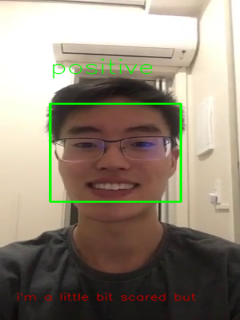

##################################################
caption polarity: [-0.6650742]
caption sentence:  i'm a little bit scared but 
face polarity:  0.9887114763259888 happy
fc :  401
fc :  402
fc :  403
fc :  404
fc :  405
fc :  406
fc :  407
fc :  408
fc :  409
fc :  410
fc :  410


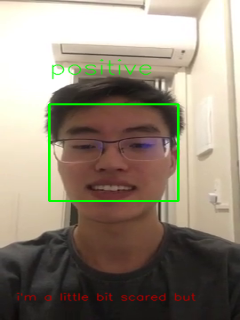

##################################################
caption polarity: [-0.6650742]
caption sentence:  i'm a little bit scared but 
face polarity:  0.9897847771644592 happy
fc :  411
fc :  412
fc :  413
fc :  414
fc :  415
fc :  416
fc :  417
fc :  418
fc :  419
fc :  420
fc :  420


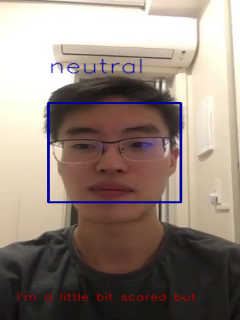

##################################################
caption polarity: [-0.6650742]
caption sentence:  i'm a little bit scared but 
you shall not pass
fc :  421
fc :  422
fc :  423
fc :  424
fc :  425
fc :  426
fc :  427
fc :  428
fc :  429
fc :  430
fc :  430


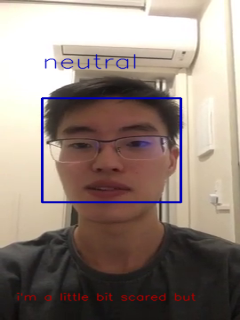

##################################################
caption polarity: [-0.6650742]
caption sentence:  i'm a little bit scared but 
face polarity:  0.0 neutral
fc :  431
fc :  432
fc :  433
fc :  434
fc :  435
fc :  436
fc :  437
fc :  438
fc :  439
fc :  440
fc :  440


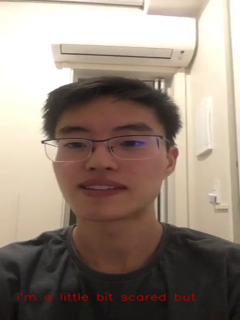

##################################################
caption polarity: [-0.6650742]
caption sentence:  i'm a little bit scared but 
you shall not pass
fc :  441
fc :  442
fc :  443
fc :  444
fc :  445
fc :  446
fc :  447
fc :  448
fc :  449
fc :  450
fc :  450


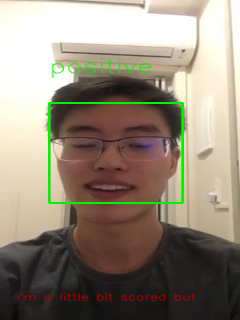

##################################################
caption polarity: [-0.6650742]
caption sentence:  i'm a little bit scared but 
face polarity:  0.944948136806488 happy
fc :  451
fc :  452
fc :  453
fc :  454
fc :  455
fc :  456
fc :  457
fc :  458
fc :  459
fc :  460
fc :  460


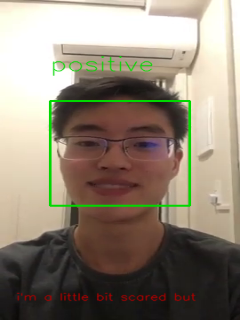

##################################################
caption polarity: [-0.6650742]
caption sentence:  i'm a little bit scared but 
face polarity:  0.9871783256530762 happy
fc :  461
fc :  462
fc :  463
fc :  464
fc :  465
fc :  466
fc :  467
fc :  468
fc :  469
fc :  470
fc :  470


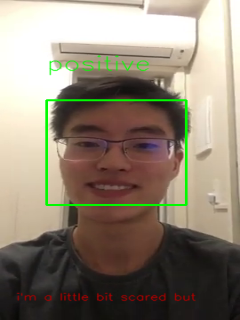

##################################################
caption polarity: [-0.6650742]
caption sentence:  i'm a little bit scared but 
face polarity:  0.9770870804786682 happy
fc :  471
fc :  472
fc :  473
fc :  474
fc :  475
fc :  476
fc :  477
fc :  478
fc :  479
fc :  480
fc :  480


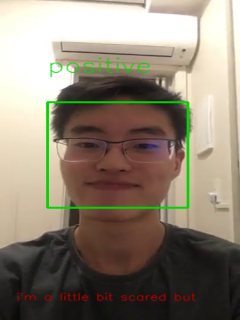

##################################################
caption polarity: [-0.6650742]
caption sentence:  i'm a little bit scared but 
face polarity:  0.8911324739456177 happy
fc :  481
fc :  482
fc :  483
fc :  484
fc :  485
fc :  486
fc :  487
fc :  488
fc :  489
fc :  490
fc :  490


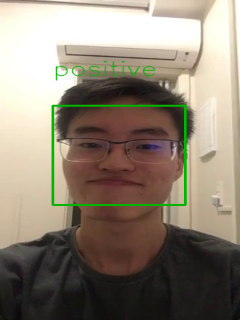

##################################################
face polarity:  0.7597833275794983 happy
fc :  491
fc :  492
fc :  493
fc :  494
fc :  495
fc :  496
fc :  497
fc :  498
fc :  499
fc :  500
fc :  500


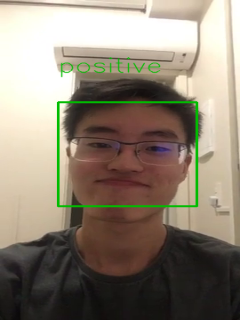

##################################################
face polarity:  0.7078027725219727 happy
fc :  501
fc :  502
fc :  503
fc :  504
fc :  505
fc :  506
fc :  507
fc :  508
fc :  509
fc :  510
fc :  510


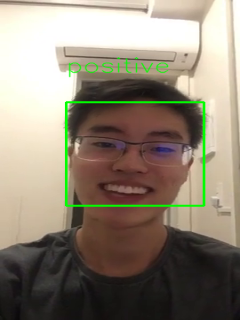

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
face polarity:  0.9988535642623901 happy
fc :  511
fc :  512
fc :  513
fc :  514
fc :  515
fc :  516
fc :  517
fc :  518
fc :  519
fc :  520
fc :  520


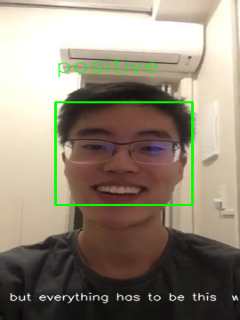

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
face polarity:  0.9987840056419373 happy
fc :  521
fc :  522
fc :  523
fc :  524
fc :  525
fc :  526
fc :  527
fc :  528
fc :  529
fc :  530
fc :  530


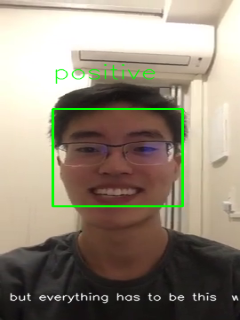

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
face polarity:  0.9986017346382141 happy
fc :  531
fc :  532
fc :  533
fc :  534
fc :  535
fc :  536
fc :  537
fc :  538
fc :  539
fc :  540
fc :  540


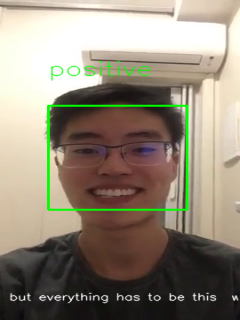

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
face polarity:  0.9937498569488525 happy
fc :  541
fc :  542
fc :  543
fc :  544
fc :  545
fc :  546
fc :  547
fc :  548
fc :  549
fc :  550
fc :  550


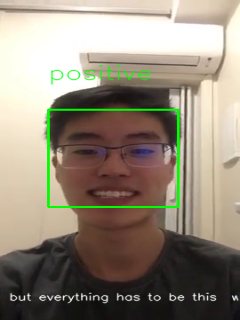

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
face polarity:  0.9897443652153015 happy
fc :  551
fc :  552
fc :  553
fc :  554
fc :  555
fc :  556
fc :  557
fc :  558
fc :  559
fc :  560
fc :  560


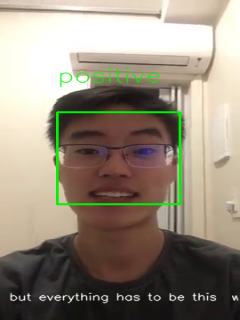

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
face polarity:  0.9565907120704651 happy
fc :  561
fc :  562
fc :  563
fc :  564
fc :  565
fc :  566
fc :  567
fc :  568
fc :  569
fc :  570
fc :  570


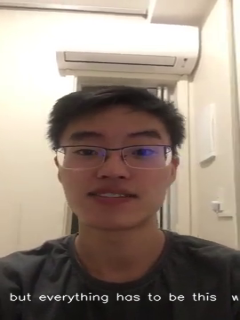

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
you shall not pass
fc :  571
fc :  572
fc :  573
fc :  574
fc :  575
fc :  576
fc :  577
fc :  578
fc :  579
fc :  580
fc :  580


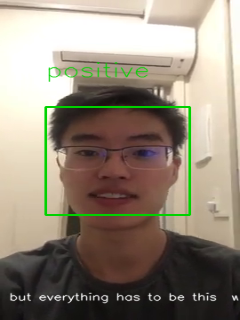

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
face polarity:  0.7533727288246155 happy
fc :  581
fc :  582
fc :  583
fc :  584
fc :  585
fc :  586
fc :  587
fc :  588
fc :  589
fc :  590
fc :  590


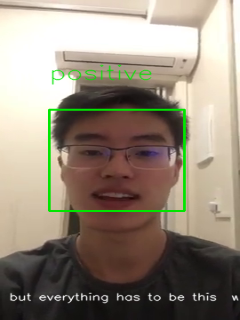

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
face polarity:  0.9614856839179993 happy
fc :  591
fc :  592
fc :  593
fc :  594
fc :  595
fc :  596
fc :  597
fc :  598
fc :  599
fc :  600
fc :  600


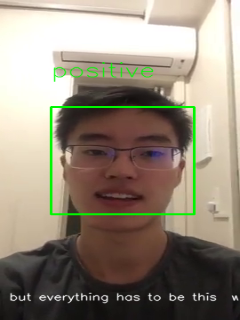

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
face polarity:  0.9019426703453064 happy
fc :  601
fc :  602
fc :  603
fc :  604
fc :  605
fc :  606
fc :  607
fc :  608
fc :  609
fc :  610
fc :  610


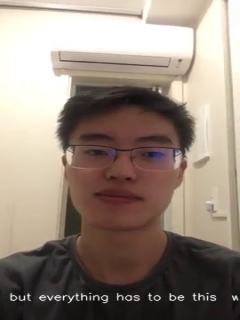

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
you shall not pass
fc :  611
fc :  612
fc :  613
fc :  614
fc :  615
fc :  616
fc :  617
fc :  618
fc :  619
fc :  620
fc :  620


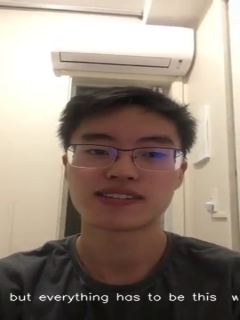

##################################################
caption polarity: [0.34762853]
caption sentence: but everything has to be this  way  
face polarity:  0.7622482776641846 happy
fc :  621
fc :  622
fc :  623
fc :  624
fc :  625
fc :  626
fc :  627
fc :  628
fc :  629
fc :  630
fc :  630


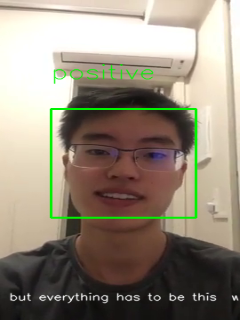

##################################################
caption polarity: [0.31321374]
caption sentence: but everything has to be this  way  I guess 
face polarity:  0.9246786832809448 happy
fc :  631
fc :  632
fc :  633
fc :  634
fc :  635
fc :  636
fc :  637
fc :  638
fc :  639
fc :  640
fc :  640


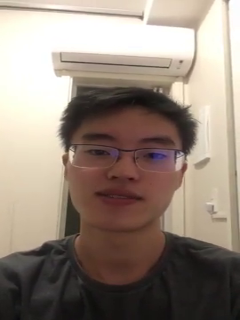

##################################################
you shall not pass
fc :  641
fc :  642
fc :  643
fc :  644
fc :  645
fc :  646
fc :  647
fc :  648
fc :  649
fc :  650
fc :  650


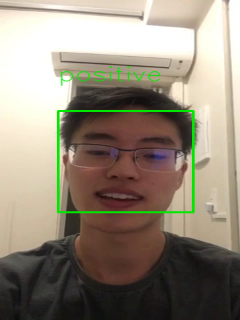

##################################################
face polarity:  0.9694046974182129 happy
fc :  651
fc :  652
fc :  653
fc :  654
fc :  655
fc :  656
fc :  657
fc :  658
fc :  659
fc :  660
fc :  660


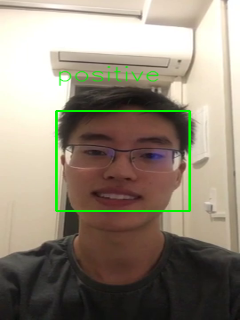

##################################################
caption polarity: [0.92834365]
caption sentence: but good luck out there 
face polarity:  0.8502857685089111 happy
fc :  661
fc :  662
fc :  663
fc :  664
fc :  665
fc :  666
fc :  667
fc :  668
fc :  669
fc :  670
fc :  670


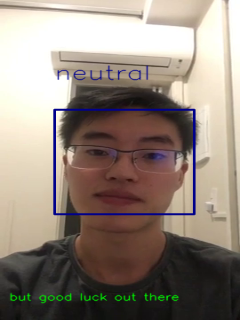

##################################################
caption polarity: [0.92834365]
caption sentence: but good luck out there 
fc :  671
fc :  672
fc :  673
fc :  674
fc :  675
fc :  676
fc :  677
fc :  678
fc :  679
fc :  680
fc :  680


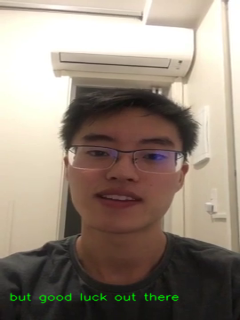

##################################################
caption polarity: [0.92834365]
caption sentence: but good luck out there 
face polarity:  0.812437891960144 happy
fc :  681
fc :  682
fc :  683
fc :  684
fc :  685
fc :  686
fc :  687
fc :  688
fc :  689
fc :  690
fc :  690


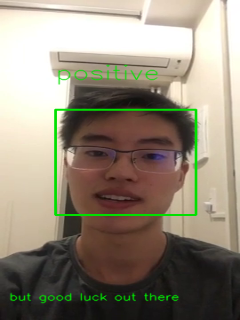

##################################################
caption polarity: [0.92834365]
caption sentence: but good luck out there 
face polarity:  0.9234442114830017 happy
fc :  691
fc :  692
fc :  693
fc :  694
fc :  695
fc :  696
fc :  697
fc :  698
face not found !
fc :  699
fc :  700
fc :  700


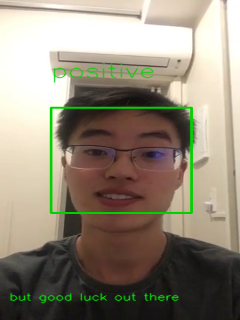

##################################################
caption polarity: [0.92834365]
caption sentence: but good luck out there 
face polarity:  0.8083177804946899 happy
fc :  701
fc :  702
fc :  703
face not found !
fc :  704
fc :  705
fc :  706
fc :  707
fc :  708
fc :  709
fc :  710
fc :  710


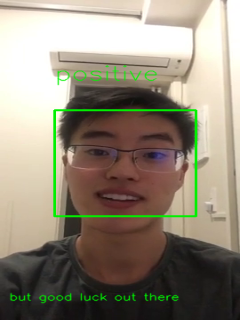

##################################################
caption polarity: [0.92834365]
caption sentence: but good luck out there 
face polarity:  0.9293797016143799 happy
fc :  711
fc :  712
fc :  713
fc :  714
fc :  715
fc :  716
fc :  717
fc :  718
fc :  719
fc :  720
fc :  720


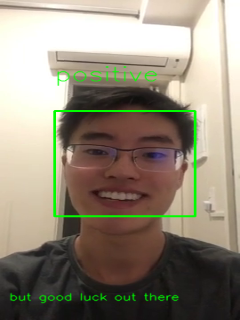

##################################################
caption polarity: [0.92834365]
caption sentence: but good luck out there 
face polarity:  0.9960306286811829 happy
fc :  721
fc :  722
fc :  723
fc :  724
fc :  725
fc :  726
fc :  727
fc :  728
fc :  729
fc :  730
fc :  730


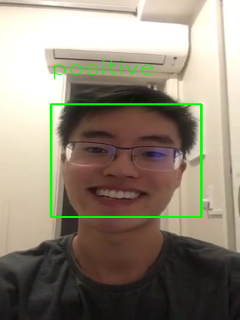

##################################################
face polarity:  0.9973374009132385 happy
fc :  731
fc :  732
fc :  733
fc :  734
fc :  735
fc :  736
fc :  737
fc :  738
fc :  739
fc :  740
fc :  740


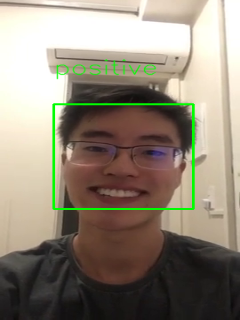

##################################################
face polarity:  0.9942979216575623 happy
fc :  741
fc :  742
fc :  743
fc :  744
fc :  745
fc :  746
fc :  747
fim !


In [29]:
img_counter = 0
time = 0
frame_counter = 0
caption_counter = 0
video_capture = cv2.VideoCapture(video_path)

# Coordenadas 
# 1 - distancia da borda lateral esquerda 
# 2 - distancia da borda superior 
#

while True:
    success , bgr_image = video_capture.read()
    
    if not success:
        print("fim !")
        break
      
    gray_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2GRAY)
    rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)
    faces = detect_faces(face_detection, gray_image)

    time = frame_counter/fps_my 


    caption = []
    caption_polarity = []
    caption_emb = []

    cur_text = return_text(time, caption_counter)
    if len(cur_text) > 0:
        color_caption, caption_polarity = predict_text(cur_text)
        caption = [cur_text]
        caption_polarity = [caption_polarity]
        caption_emb = [get_embedding(cur_text,predictor_bert_lex)]
        if frame_counter % video_frequency == 0:
        
          print("caption polarity:", caption_polarity)
          print("caption sentence:", cur_text)

        color_caption = color_caption.tolist()
        draw_text(np.array([10,max_res - 30,50,50]), rgb_image, cur_text,color_caption,font_scale=0.5, thickness=1)
        while caption_counter < len(captions_list) - 1 and time >= captions_list[caption_counter][2]:  
            caption_counter += 1

    face = []
    face_polarity = []
    face_emb = []
    if len(faces) == 0 :
      print("face not found !")

    for face_coordinates in faces:

        x1, x2, y1, y2 = apply_offsets(face_coordinates, emotion_offsets)

        gray_face = gray_image[y1:y2, x1:x2]
        try:
            gray_face = cv2.resize(gray_face, (emotion_target_size))
        except cv2.error:
            print('error : on resize')
            continue

        gray_face = my_preprocess_input(gray_face, True)
        gray_face = np.expand_dims(gray_face, 0)
        gray_face = np.expand_dims(gray_face, -1)

        emotion_prediction = emotion_classifier.predict(gray_face)
        emotion_probability = np.max(emotion_prediction)
        emotion_label_arg = np.argmax(emotion_prediction)

        emotion_text = emotion_labels[emotion_label_arg]
        emotion_window.append(emotion_text)

        if len(emotion_window) > frame_window:
            emotion_window.pop(0)
        try:
            emotion_mode = mode(emotion_window)
        except:
            continue

        ### threshold wall
        # ysnp = you shall not pass
        ysnp = False
        sentiment = 'neutral'
        if emotion_text == 'angry' and emotion_probability >= 0.5:
            ysnp = True
            sentiment = 'negative'
        if emotion_text == 'happy' and emotion_probability >= 0.7:
            ysnp = True
            sentiment = 'positive'
        if emotion_text == 'sad' and emotion_probability >= 0.45:
            ysnp = True
            sentiment = 'negative'
        if emotion_text == 'neutral' and emotion_probability >= 0.5:
            ysnp = True
            sentiment = 'neutral'
        if emotion_text == 'fear' and emotion_probability >= 0.5:
            ysnp = True
            sentiment = 'negative'
        if emotion_text == 'surprise' and emotion_probability >= 0.4:
            ysnp = True
            sentiment = 'positive'

        if ysnp:
            senti_multi = 0
            if sentiment == 'negative':
                senti_multi = -1
                color = emotion_probability * np.asarray((255, 0, 0))
            elif sentiment == 'positive':
                senti_multi = 1
                color = emotion_probability * np.asarray((0, 255, 0))
            else:
                senti_multi = 0
                color = emotion_probability * np.asarray((0, 0, 255))

            color = color.astype(int)
            color = color.tolist()

            draw_bounding_box(face_coordinates, rgb_image, color)
            draw_text(face_coordinates, rgb_image, sentiment,color, 0, -45, 1, 1)
            if frame_counter % video_frequency == 0:
              print('face polarity: ', emotion_probability * senti_multi,emotion_text)


            face.append('img' + str(img_counter))
            face_polarity.append(emotion_probability * senti_multi)
            face_emb.append(getFaceEmbedding(gray_face) )

            img_counter += 1
        else:
          if frame_counter % video_frequency == 0:
            print("you shall not pass")

   
    dict_temp= fill_dict(frame_counter, time,
                        caption, caption_polarity, caption_emb,
                        face, face_polarity, face_emb)       
    for key in dict_temp.keys():
      video_dict_all[key] += dict_temp[key]
    
    frame_counter += 1

  # if len(cur_text) > 0:
    print("fc : ",frame_counter)
    resized = cv2.resize(rgb_image, size_shape)

    if frame_counter % video_frequency == 0:
      print("fc : ",frame_counter)
      resized = cv2.resize(rgb_image, size_shape)
      bgr_image = cv2.cvtColor(resized, cv2.COLOR_RGB2BGR)
      cv2_imshow( bgr_image)
      print("#" * 50)
    # break

video_capture.release()
cv2.destroyAllWindows()

In [30]:
import pandas as pd

video_df = pd.DataFrame(video_dict_all)

video_df.head()

,frame,time,caption,caption_polarity,caption_emb,face,face_polarity,face_emb
0,0,0.000000,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img0,0.0,"[-1.9817163, -7.3088126, -0.21658541, 1.669580..."
1,0,0.000000,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img0,0.0,"[-1.9817163, -7.3088126, -0.21658541, 1.669580..."
2,1,0.033333,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img1,0.0,"[-2.352778, -7.106796, -0.8064247, 3.150187, -..."
3,2,0.066667,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img2,0.0,"[-1.0932013, -4.5289173, 1.1658473, 1.0311189,..."
4,3,0.100000,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img3,0.0,"[-4.0827966, -7.5882483, -0.90059954, 3.067538..."


# Gerando DataFrames de concordância

In [31]:
def concord_bool(a,b):
  multi = a * b
  if multi >= 0:
    return True
  return False

def concord_val(a,b):
  (pa , pb) = (a,b)
  if abs(a) < 0.3:
    pa = 0
  if abs(b) < 0.3:
    pb = 0
  multi = pa * pb
  if multi >= 0:
    if pa < 0 or pb < 0:
      return 'negative'
    if pa > 0 or pb > 0:
      return 'positive'
  return 'neutral'

def return_dict():
  dict_aux = {
    'frame' : [],
    'time' : [],
    'caption' : [],
    'caption_polarity' : [],
    'caption_emb' : [],
    'face' : [],
    'face_polarity' : [],
    'face_emb' : [],
    'intent' : []
  }
  return dict_aux

In [32]:
def get_concord_embedding():
  global video_df
  couter = 0
  df_train = return_dict()
  df_test = return_dict()
  concord = []
  for i , row in video_df.iterrows():
    if concord_bool(row['face_polarity'],row['caption_polarity']):
      for key in row.keys():
        df_train[key].append(row[key])
      df_train['intent'].append(concord_val(row['face_polarity'],row['caption_polarity']))
      concord.append(1)
    else:
      for key in row.keys():
        df_test[key].append(row[key])
      df_test['intent'].append(concord_val(row['face_polarity'],row['caption_polarity']))
      concord.append(0)
  video_df['consent'] = concord
  return df_train, df_test


In [33]:
(df_train, df_test) =  get_concord_embedding()
df_train = pd.DataFrame(df_train)
df_test = pd.DataFrame(df_test)


In [34]:
df_train.head()

,frame,time,caption,caption_polarity,caption_emb,face,face_polarity,face_emb,intent
0,0,0.000000,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img0,0.0,"[-1.9817163, -7.3088126, -0.21658541, 1.669580...",positive
1,0,0.000000,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img0,0.0,"[-1.9817163, -7.3088126, -0.21658541, 1.669580...",positive
2,1,0.033333,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img1,0.0,"[-2.352778, -7.106796, -0.8064247, 3.150187, -...",positive
3,2,0.066667,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img2,0.0,"[-1.0932013, -4.5289173, 1.1658473, 1.0311189,...",positive
4,3,0.100000,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img3,0.0,"[-4.0827966, -7.5882483, -0.90059954, 3.067538...",positive


# Definindo o modelo multimodal

In [35]:
import tensorflow as tf
ACCURACY_THRESHOLD = 0.95
class acc_callback(tf.keras.callbacks.Callback): 
    def on_epoch_end(self, epoch, logs={}): 
        if(logs.get('accuracy') > ACCURACY_THRESHOLD):   
            self.model.stop_training = True

In [36]:
from tensorflow.keras.layers import Dot,Activation,Dense, Input, concatenate, multiply, average, subtract, add, Dropout, Lambda, Flatten
from tensorflow.keras.models import Model
import tensorflow as tf


def multimodal_text_image(num_classes,size_1=img_feat_size,size_2=text_feat_size,operator='concatenate',verbose=0):

  # fusion_dim = X_1.shape[1]+X_2.shape[1]
  fusion_dim = size_1

  inp1 = Input(shape=size_1)
  inp2 = Input(shape=size_2)

  l1 = Dense(fusion_dim, activation='relu')(inp1)
  l2 = Dense(fusion_dim, activation='relu')(inp2)

  if(operator=='att'):
    visual_embd = Lambda(lambda x: tf.keras.backend.l2_normalize(x, axis=-1))(l1) # (bs, ndim)
    average_seq = Lambda(lambda x: tf.keras.backend.l2_normalize(x, axis=-1))(l2) # (bs, ndim)
    scalar_visual = Dense(1)(visual_embd) # (bs, 1)
    scalar_text = Dense(1)(average_seq) # (bs, 1)
    scalars = concatenate([scalar_visual, scalar_text], name='concat')  # (bs, 2)

    # # Step 2. Normalize weights - softmax
    alphas = Activation('softmax')(scalars) # (bs, 2)

    # Step 3. Weighted average
    visual_embd_2 = Lambda( lambda x: tf.keras.backend.expand_dims(x) ) (visual_embd) # (bs, ndim, 1)
    average_seq_2 = Lambda( lambda x: tf.keras.backend.expand_dims(x) )(average_seq) # (bs, ndim, 1)
    features = concatenate([visual_embd_2, average_seq_2], name='concat_feats') # (bs, ndim, 2)
    w = Dot(axes=[-1, -1])([alphas, features]) # (bs, ndim)

  w = Dropout(0.5)(w)
  # fusion_layer = Dense(fusion_dim, activation='relu')(w)
  fusion_layer = w

  if (operator == 'att_labels'): # nm: new
    output = Dense(1)(fusion_layer)  # (batch_size, nb_labels, 1)  
    output = Lambda(lambda x: tf.keras.backend.squeeze(x, axis=-1))(output)  # (batch_size, nb_labels)
    output = Activation('softmax')(output)  # (batch_size, nb_labels)    
  else:
    output = Dense(num_classes,activation='softmax')(fusion_layer)

  model = Model(inputs=[inp1, inp2], outputs=output)

  model.compile(optimizer='adam', loss='categorical_crossentropy')
  model.summary()

  return model, fusion_layer



In [37]:
import keras 
from tqdm.notebook import tqdm

target = 'intent'

merging_layers = ['autoencoder', 'att_labels','att','concatenate','add','subtract','average','multiply']

num_classes = len(df_train[target].unique())
operator = "att"
# Gerando os modelos
my_model, _ = multimodal_text_image(num_classes,operator=operator)




# merging_layers = ['att', 'att_labels'] # test
results = []



(df_data_train, df_data_test) = (df_train, df_test)

total_rows = len(df_data_train[target])

# modalidade da imagem
X_1 = np.array(df_data_train['face_emb'].to_list())
# modalidade do texto
X_2 = np.array(df_data_train['caption_emb'].to_list())

Y = np.array(pd.get_dummies(df_data_train[target]))

num_classes = len(df_data_train[target].unique())

# modalidades imagem e texto do teste
X_1_test = np.array(df_data_test['face_emb'].to_list())
X_2_test = np.array(df_data_test['caption_emb'].to_list())

acc_call = acc_callback()


history = my_model.fit([X_1,X_2], Y,
                  epochs=50,
                  batch_size=16,
                  shuffle=True,verbose=True)

probs = my_model.predict([X_1_test,X_2_test])

y_pred = np.argmax(probs,axis=1)


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 112)]        0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 768)]        0                                            
__________________________________________________________________________________________________
dense_5 (Dense)                 (None, 112)          12656       input_3[0][0]                    
__________________________________________________________________________________________________
dense_6 (Dense)                 (None, 112)          86128       input_4[0][0]                    
____________________________________________________________________________________________

In [38]:
dict_y_pred = {
    0 : 'negative', 
    1 : 'neutral',
    2 : 'positive'
}

In [39]:
y_pred_value = [dict_y_pred[pred] for pred in y_pred]

In [40]:
index = video_df[video_df['consent'] == 0].index

In [41]:
y_pred_value_size = len(y_pred_value)

tuple_idx_val = []

for i in range(y_pred_value_size):
  tuple_idx_val.append((index[i], y_pred_value[i]))

In [42]:
video_consent_df = video_df[video_df['consent'] == 1]

for idx, row in video_consent_df.iterrows():
  tuple_idx_val.append((idx, concord_val(row['caption_polarity'],row['face_polarity']) ))

In [43]:
tuple_idx_val.sort(key=lambda x:x[0])
final_pred = [i[1] for i in tuple_idx_val]


video_df['final_pred'] = final_pred

In [44]:
video_df

,frame,time,caption,caption_polarity,caption_emb,face,face_polarity,face_emb,consent,final_pred
0,0,0.000000,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img0,0.000000,"[-1.9817163, -7.3088126, -0.21658541, 1.669580...",1,positive
1,0,0.000000,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img0,0.000000,"[-1.9817163, -7.3088126, -0.21658541, 1.669580...",1,positive
2,1,0.033333,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img1,0.000000,"[-2.352778, -7.106796, -0.8064247, 3.150187, -...",1,positive
3,2,0.066667,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img2,0.000000,"[-1.0932013, -4.5289173, 1.1658473, 1.0311189,...",1,positive
4,3,0.100000,Today we are going to,0.720488,"[0.18716481, -0.08017134, 0.8622961, -0.152368...",img3,0.000000,"[-4.0827966, -7.5882483, -0.90059954, 3.067538...",1,positive
...,...,...,...,...,...,...,...,...,...,...
744,742,24.733333,-1,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",img593,0.990001,"[-3.3293436, -7.5548964, -1.9924031, 9.047642,...",1,positive
745,743,24.766667,-1,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",img594,0.928760,"[-2.1451643, -7.569681, -1.0998985, 6.670694, ...",1,positive
746,744,24.800000,-1,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",img595,0.921897,"[-1.7681359, -7.860549, -1.51114, 6.8058753, -...",1,positive
747,745,24.833333,-1,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",img596,0.905973,"[-2.723695, -6.9611998, -1.5060092, 6.220243, ...",1,positive


# Showing prediction

In [45]:
def draw_plus_sign(img, center=(10,10) ):
  start_point = (center[0] - 5, center[1] - 2)
  end_point = (center[0] + 5, center[1] + 2)
  img_r = cv2.rectangle(img, start_point, end_point, (0,255,0), -1)

  start_point = (center[0] - 2, center[1] - 5)
  end_point = (center[0] + 2, center[1] + 5)
  img_r = cv2.rectangle(img_r, start_point, end_point, (0,255,0), -1)

  return img_r

def draw_minus_sign(img, center=(10,10)):
  start_point = (center[0] - 5, center[1] - 2)
  end_point = (center[0] + 5, center[1] + 2)
  img_r = cv2.rectangle(img, start_point, end_point, (255,0,0), -1)

  return img_r

In [46]:
time_arr =video_df['time'].to_list()
final_pred_arr = video_df['final_pred'].to_list()
size_total = len(time_arr)

In [47]:
tuple_time_pred = [(time_arr[i], final_pred_arr[i]) for i in range(size_total)]

In [48]:
### re inicializando as variáveis.

video_capture = cv2.VideoCapture(video_path)
time = 0
frame_counter = 0
caption_counter = 0
counter_tuple_total = 0 

fc :  10


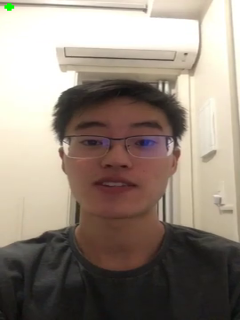

##################################################
fc :  20


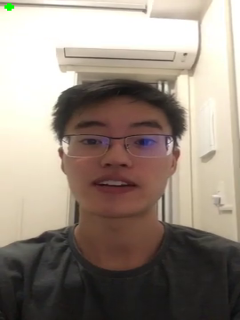

##################################################
fc :  30


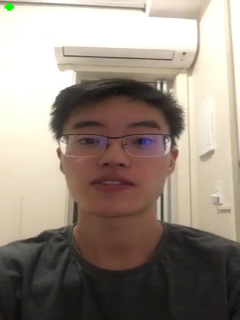

##################################################
fc :  40


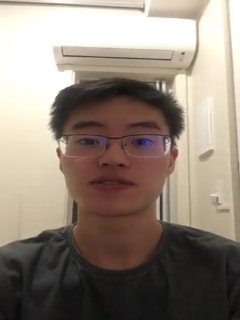

##################################################
fc :  50


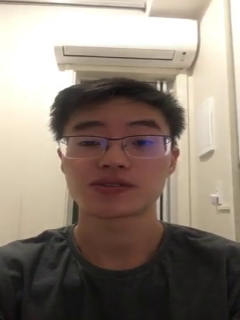

##################################################
fc :  60


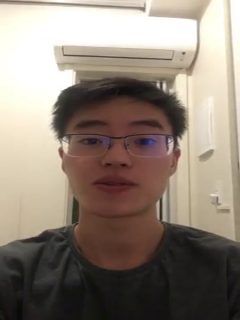

##################################################
fc :  70


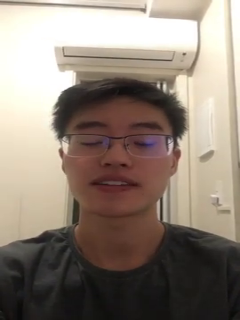

##################################################
fc :  80


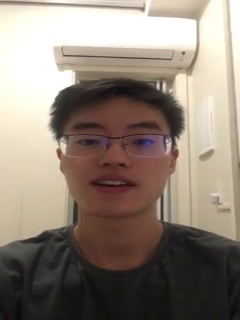

##################################################
fc :  90


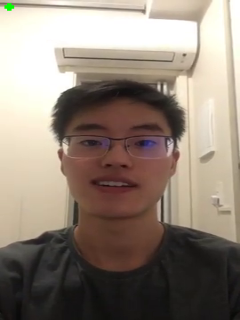

##################################################
fc :  100


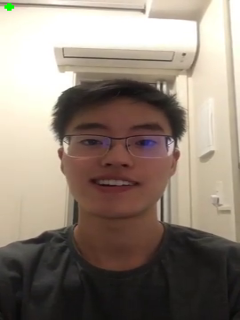

##################################################
fc :  110


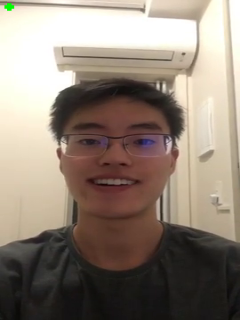

##################################################
fc :  120


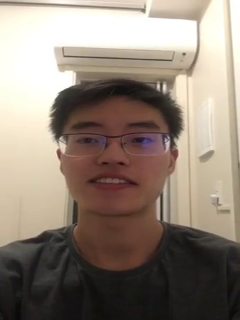

##################################################
fc :  130


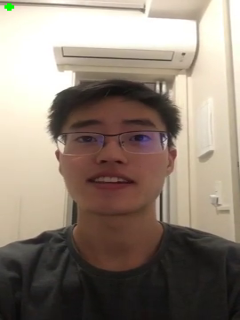

##################################################
fc :  140


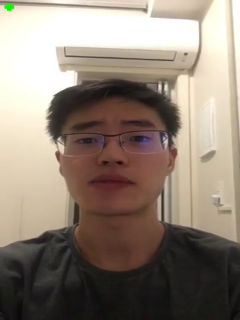

##################################################
fc :  150


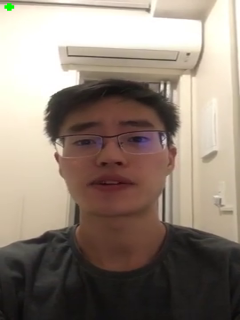

##################################################
fc :  160


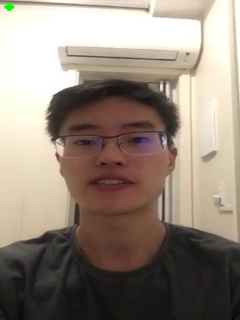

##################################################
fc :  170


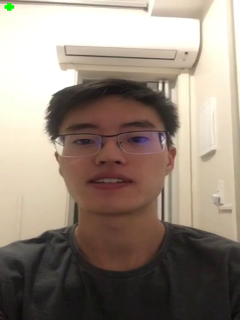

##################################################
fc :  180


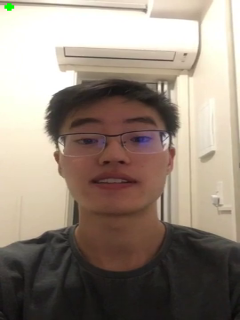

##################################################
fc :  190


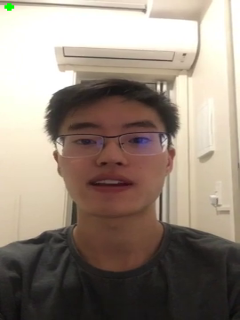

##################################################
fc :  200


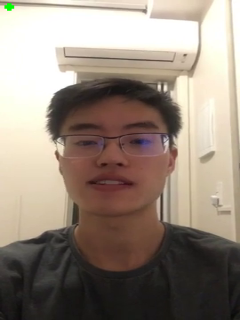

##################################################
fc :  210


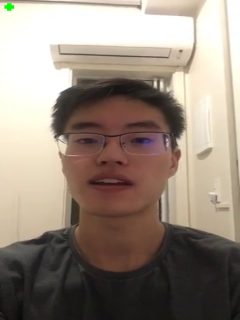

##################################################
fc :  220


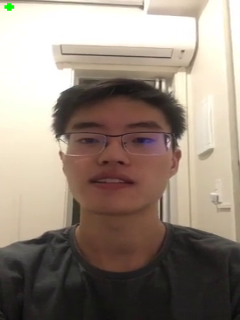

##################################################
fc :  230


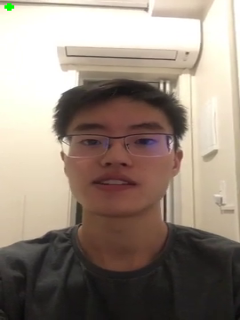

##################################################
fc :  240


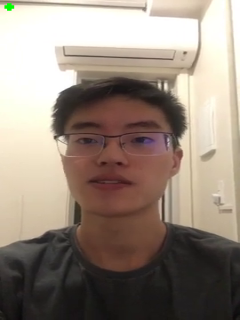

##################################################
fc :  250


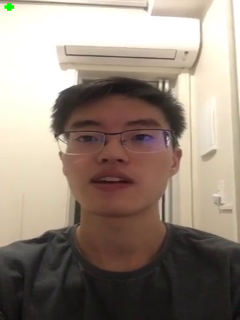

##################################################
fc :  260


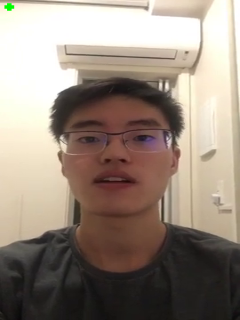

##################################################
fc :  270


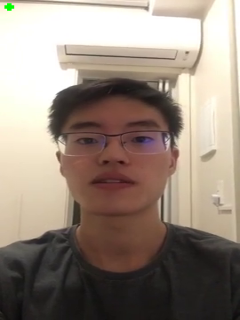

##################################################
fc :  280


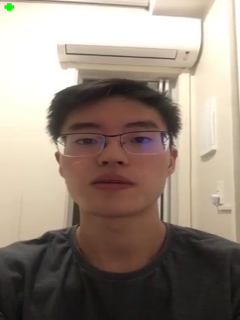

##################################################
fc :  290


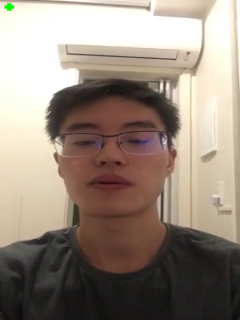

##################################################
fc :  300


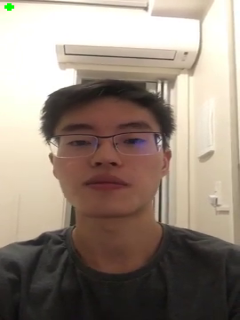

##################################################
fc :  310


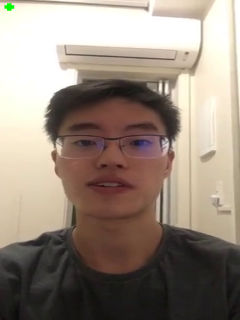

##################################################
fc :  320


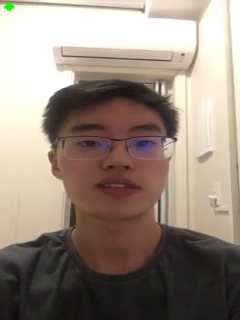

##################################################
fc :  330


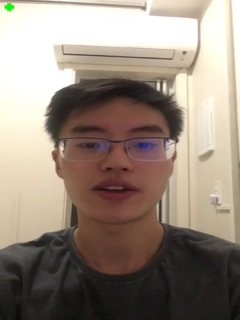

##################################################
fc :  340


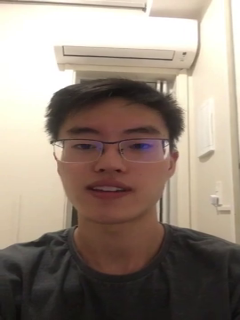

##################################################
fc :  350


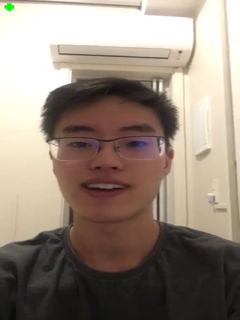

##################################################
fc :  360


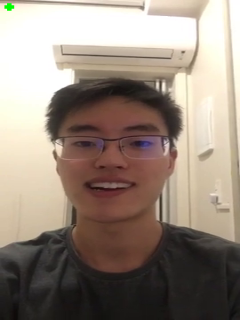

##################################################
fc :  370


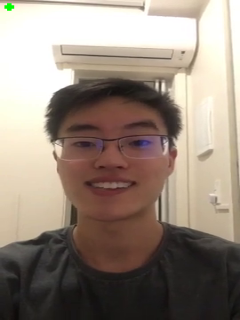

##################################################
fc :  380


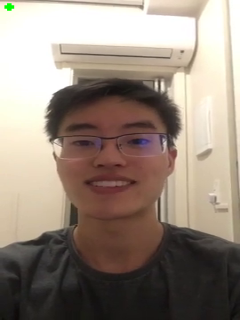

##################################################
fc :  390


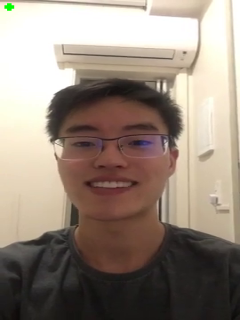

##################################################
fc :  400


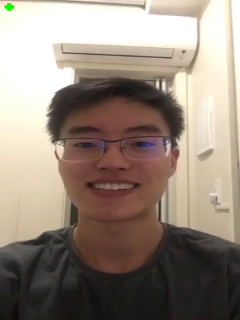

##################################################
fc :  410


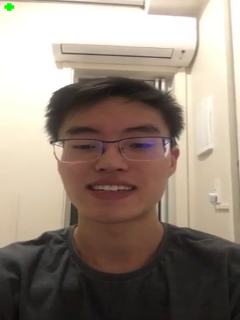

##################################################
fc :  420


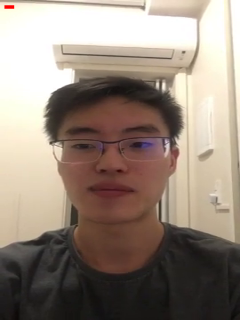

##################################################
fc :  430


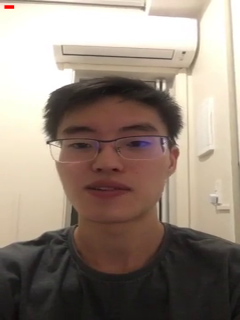

##################################################
fc :  440


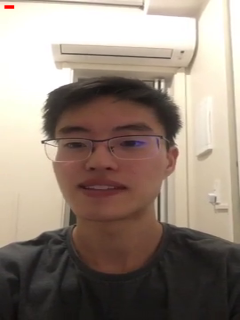

##################################################
fc :  450


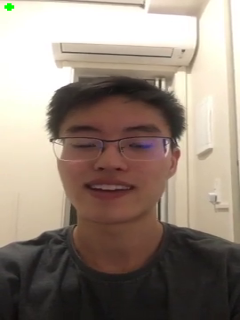

##################################################
fc :  460


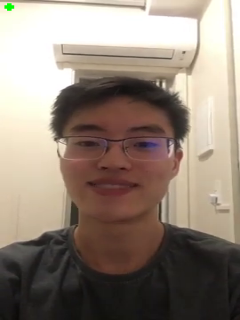

##################################################
fc :  470


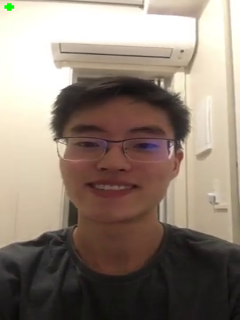

##################################################
fc :  480


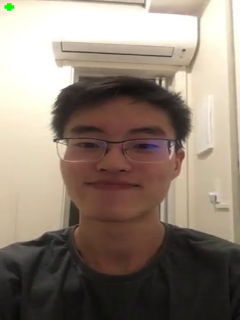

##################################################
fc :  490


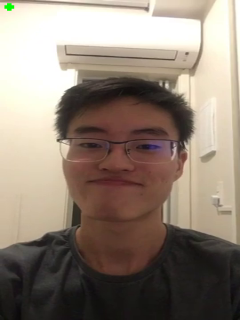

##################################################
fc :  500


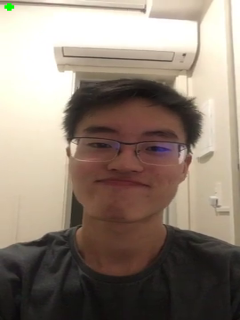

##################################################
fc :  510


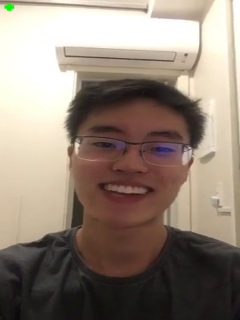

##################################################
fc :  520


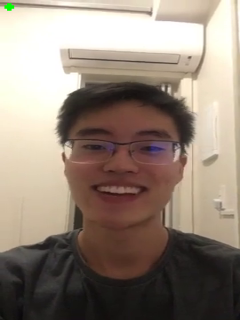

##################################################
fc :  530


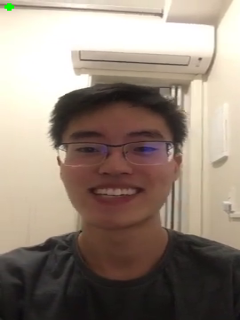

##################################################
fc :  540


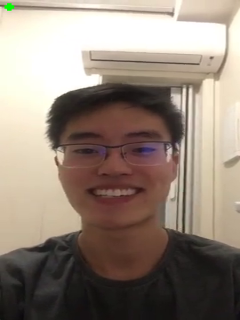

##################################################
fc :  550


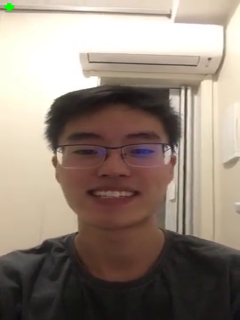

##################################################
fc :  560


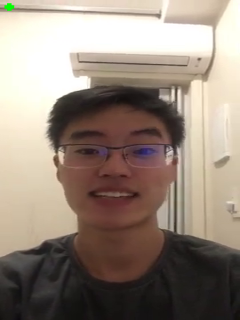

##################################################
fc :  570


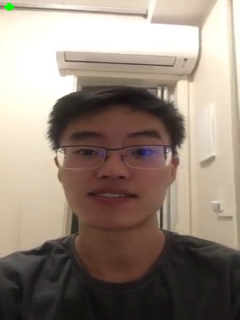

##################################################
fc :  580


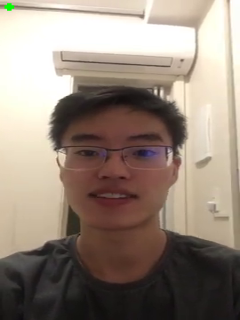

##################################################
fc :  590


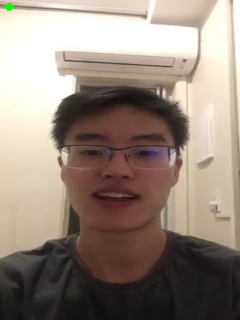

##################################################
fc :  600


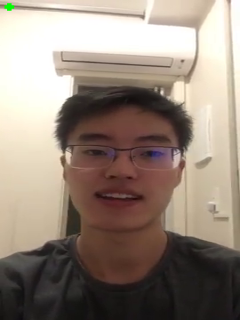

##################################################
fc :  610


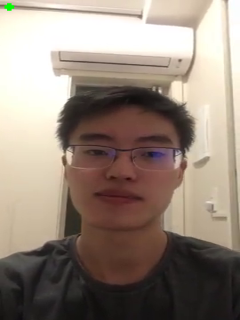

##################################################
fc :  620


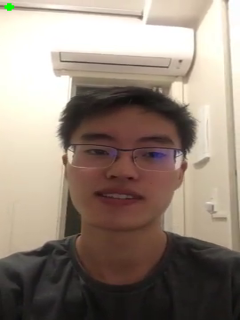

##################################################
fc :  630


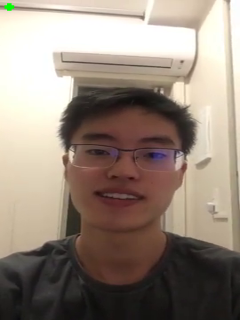

##################################################
fc :  640


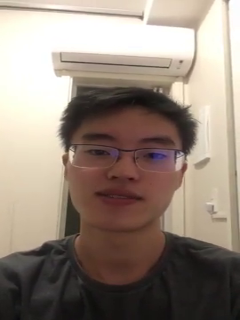

##################################################
fc :  650


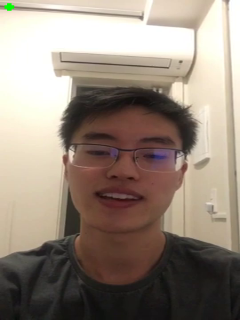

##################################################
fc :  660


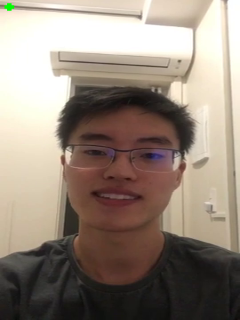

##################################################
fc :  670


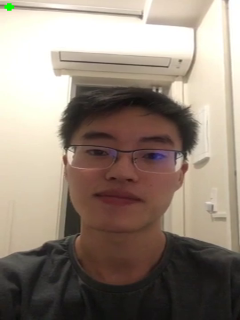

##################################################
fc :  680


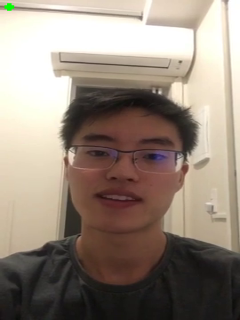

##################################################
fc :  690


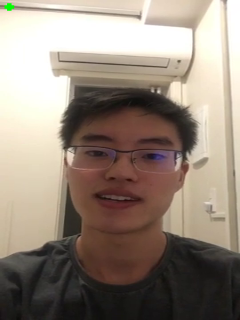

##################################################
fc :  700


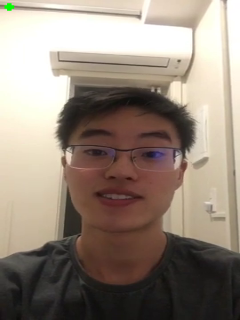

##################################################
fc :  710


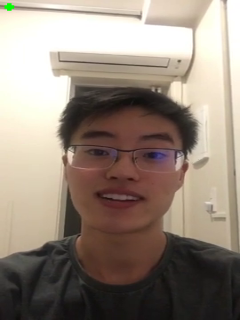

##################################################
fc :  720


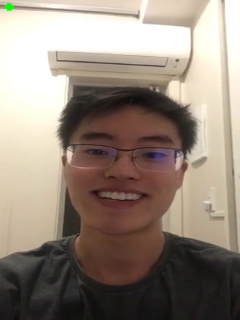

##################################################
fc :  730


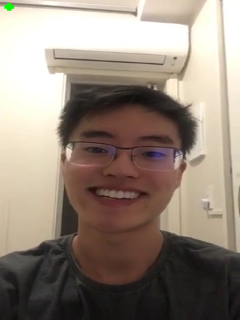

##################################################
fc :  740


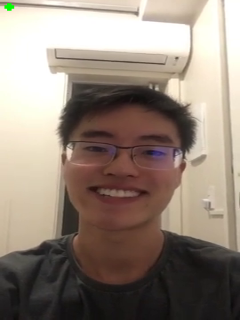

##################################################


In [49]:
while True:
    success , bgr_image = video_capture.read()
    
    if not success:
        break
    gray_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2GRAY)
    rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

    time = frame_counter/fps_my 



    if time >= captions_list[caption_counter][1] and time <= captions_list[caption_counter][2]:
        color_caption = (255,255,255)
        draw_text(np.array([10,max_res - 30,50,50]), rgb_image, cur_text,color_caption,font_scale=0.5, thickness=1)

        if caption_counter < len(captions_list) - 1 and time >= captions_list[caption_counter + 1][1]:  
            caption_counter += 1

    if time >= tuple_time_pred[counter_tuple_total][0]:
        if (tuple_time_pred[counter_tuple_total][1] == 'positive') :
          rgb_image = draw_plus_sign(rgb_image)
        elif (tuple_time_pred[counter_tuple_total][1] == 'negative'):
          rgb_image = draw_minus_sign(rgb_image)

        if counter_tuple_total < len(tuple_time_pred) - 1 and time >= tuple_time_pred[counter_tuple_total + 1][0]:  
            counter_tuple_total += 1
    
    
    frame_counter += 1

  
    if frame_counter % video_frequency == 0:
      print("fc : ",frame_counter)
      resized = cv2.resize(rgb_image, size_shape)
      bgr_image = cv2.cvtColor(resized, cv2.COLOR_RGB2BGR)
      cv2_imshow( bgr_image)
      print("#" * 50)

video_capture.release()
cv2.destroyAllWindows()